In [3]:
import os
import pandas as pd

def create_csv_from_images_points(image_folder, points_folder, output_csv):
    data = []

    # Loop through each image and corresponding points file
    for image_file in os.listdir(image_folder):
        if image_file.endswith(".JPG"):  # Filter JPG files
            image_path = os.path.join(image_folder, image_file)
            
            # Extract age from the 5th and 6th index of image file name
            age = int(image_file[4:6])

            # Construct points file name (assuming same name but with .pts extension)
            points_file = os.path.join(points_folder, image_file.replace(".JPG", ".pts"))

            # Read the points file
            with open(points_file, 'r') as f:
                lines = f.readlines()
                # Extract the points data (starting after "n_points: 68")
                points = [line.strip().split() for line in lines[3:] if line.strip()]
                points = [(float(x), float(y)) for x, y in points]

            # Flatten the points into a list of x, y pairs
            flat_points = [coord for point in points for coord in point]

            # Append the image file and points data to the list
            row = [image_file] + flat_points + [age]
            data.append(row)

    # Create a dataframe with columns for image_file, pts_01_x, pts_01_y, ..., pts_68_x, pts_68_y, age
    columns = ['image_file'] + [f'pts_{i+1:02}_x' for i in range(68)] + [f'pts_{i+1:02}_y' for i in range(68)] + ['age']
    df = pd.DataFrame(data, columns=columns)

    # Save the dataframe to a CSV file
    df.to_csv(output_csv, index=False)
    print(f"CSV file '{output_csv}' created successfully!")

# Usage
image_folder = 'FGNET/images'   # Replace with actual path to the images folder
points_folder = 'FGNET/points'  # Replace with actual path to the points folder
output_csv = 'output.csv'                 # Desired output CSV file name

create_csv_from_images_points(image_folder, points_folder, output_csv)


ValueError: not enough values to unpack (expected 2, got 1)

In [8]:
import os
import csv

# Paths to the images and points directories
image_folder = 'FGNET/images'   # Replace with actual path to the images folder
points_folder = 'FGNET/points' 

# CSV output file path
csv_output_file = 'output.csv'

# Define the header for the CSV
csv_header = ['image_file', 'age'] + [f'pts_{i:02d}_x' for i in range(1, 69)] + [f'pts_{i:02d}_y' for i in range(1, 69)]

# Function to read points from the points file
def read_points_file(points_file):
    with open(points_file, 'r') as f:
        lines = f.readlines()
        points = [tuple(map(float, line.split())) for line in lines if line.strip().replace('.', '', 1).isdigit()]
    return points

# Function to extract age from the image file name
def extract_age(image_file):
    return int(image_file[4:6])

# Create and write to the CSV file
with open(csv_output_file, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(csv_header)

    # Iterate over the image files
    for image_file in os.listdir(image_folder):
        if image_file.endswith('.JPG'):  # Only process .JPG files
            image_path = os.path.join(image_folder, image_file)
            
            # Extract the age from the image file name
            age = extract_age(image_file)
            
            # Find the corresponding points file
            points_file = os.path.join(points_folder, image_file.replace('.JPG', '.pts'))  # Assuming same name but .pts extension
            
            if os.path.exists(points_file):
                # Read points from the points file
                points = read_points_file(points_file)
                
                # Flatten the points list (X and Y) to match the header format
                flat_points = [coord for point in points for coord in point]
                
                # Write the row to the CSV
                writer.writerow([image_file, age] + flat_points)


In [84]:
import os
import glob
import csv
import numpy as np

def load_points(pts_file):
    """Loads 2D facial points from .pts files."""
    with open(pts_file, 'r') as f:
        lines = f.readlines()[3:-1]  # Skip the first 3 lines and the last line (version info)
        points = [list(map(float, line.strip().split())) for line in lines]
    return np.array(points)

def create_csv(image_folder, points_folder, output_csv):
    """Create a CSV file with image filenames and corresponding facial landmark points."""
    image_files = sorted(glob.glob(os.path.join(image_folder, '*.JPG')))
    points_files = sorted(glob.glob(os.path.join(points_folder, '*.pts')))
    
    # Ensure that the number of images and points files match
    if len(image_files) != len(points_files):
        raise ValueError("Number of image files does not match number of points files.")
    
    # Prepare CSV file for writing
    with open(output_csv, 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        
        # Write the header (image_file, pts_1_x, pts_1_y, ..., pts_68_x, pts_68_y)
        header = ['image_file']
        for i in range(68):
            header.append(f'pts_{i+1}_x')
            header.append(f'pts_{i+1}_y')
        writer.writerow(header)
        
        # Write the data for each image and corresponding points
        for img_file, pts_file in zip(image_files, points_files):
            points = load_points(pts_file)  # Load the points from the .pts file
            row = [os.path.basename(img_file)]  # Start with the image filename
            for point in points:
                row.extend(point)  # Append the (x, y) coordinates of each point
            writer.writerow(row)
    
    print(f"CSV file '{output_csv}' created successfully.")

# Paths to the images and points folders
image_folder = 'FGNET/images'
points_folder = 'FGNET/points'

# Output CSV file path
output_csv = 'facial_landmarks.csv'

# Create the CSV
create_csv(image_folder, points_folder, output_csv)


CSV file 'facial_landmarks.csv' created successfully.


In [85]:
from IPython.display import HTML

def create_download_link(file_name):
    return HTML(f'<a href="{file_name}" download>Click here to download {file_name}</a>')

# Replace 'image_points_data.csv' with your file name
create_download_link('image_points_data.csv')


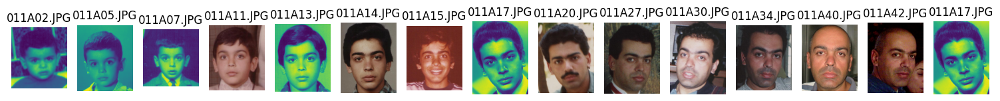

In [86]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Define paths
image_directory = 'FGNET/images'  # Replace with the actual path to your images
csv_file_path = 'facial_landmarks.csv'   # Replace with the path to your CSV file

# Upload an image
# uploaded_image = "002A02.JPG"  # Example of an uploaded image
uploaded_image = "011A17.JPG"
# Load the CSV file
df = pd.read_csv(csv_file_path)

# Extract image filenames from the CSV (assuming the column name is 'image_file')
csv_image_filenames = df['image_file'].tolist()

# Function to extract the 2nd and 3rd digits from the filename
def extract_digits(filename):
    return filename[1:3]

# Extract the target digits from the uploaded image
target_digits = extract_digits(uploaded_image)

# Filter filenames to include only those matching the uploaded image's digits
filtered_images = [img for img in csv_image_filenames if extract_digits(img) == target_digits]

# Include the uploaded image in the list
filtered_images.append(uploaded_image)

# Sort the filtered filenames
sorted_images = sorted(filtered_images, key=lambda x: extract_digits(x))

# Function to display images
def display_images(image_list, img_dir):
    plt.figure(figsize=(15, 15))  # Adjust as needed based on the number of images
    
    for idx, img_name in enumerate(image_list):
        img_path = os.path.join(img_dir, img_name)
        if os.path.exists(img_path):
            img = Image.open(img_path)
            plt.subplot(1, len(image_list), idx + 1)  # Adjust grid based on the number of images
            plt.imshow(img)
            plt.title(img_name)
            plt.axis('off')  # Hide axis for clean display
    
    plt.tight_layout()
    plt.show()

# Display filtered and sorted images
display_images(sorted_images, image_directory)


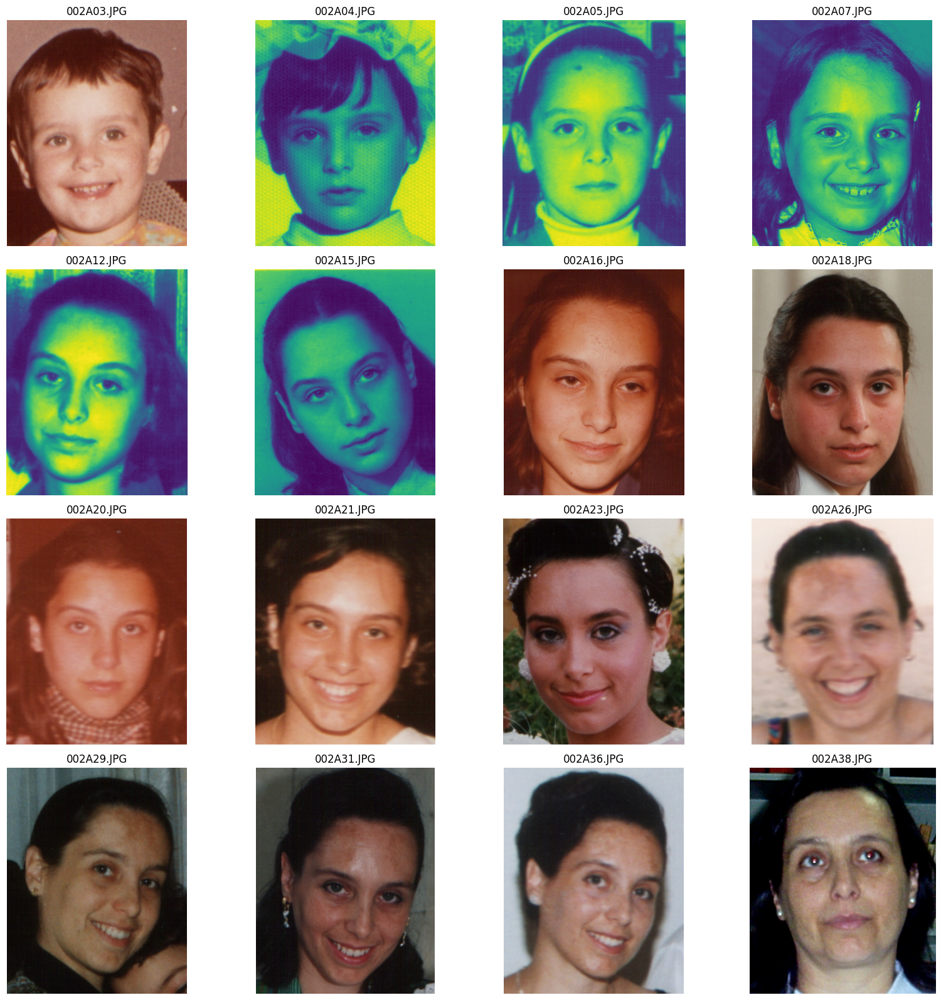

In [87]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Define paths
image_directory = 'FGNET/images'  # Replace with the actual path to your images
csv_file_path = 'facial_landmarks.csv'   # Replace with the path to your CSV file

# Upload an image
# uploaded_image = "001A02.JPG"  # Example of an uploaded image
uploaded_image = "002A02.JPG" 

# Load the CSV file
df = pd.read_csv(csv_file_path)

# Extract image filenames from the CSV (assuming the column name is 'image_file')
csv_image_filenames = df['image_file'].tolist()

# Function to extract the 2nd and 3rd digits from the filename
def extract_digits(filename):
    return filename[1:3]

# Extract digits from the uploaded image
uploaded_digits = extract_digits(uploaded_image)

# Filter images with the same 2nd and 3rd digits
filtered_images = [img for img in csv_image_filenames if extract_digits(img) == uploaded_digits]
filtered_images.append(uploaded_image)  # Include the uploaded image

# Function to display images
def display_images(image_list, img_dir):
    cols = 4  # Number of columns
    rows = len(image_list) // cols + (len(image_list) % cols > 0)  # Calculate rows needed

    plt.figure(figsize=(cols * 4, rows * 4))  # Adjust figure size based on number of images
    
    for idx, img_name in enumerate(image_list):
        img_path = os.path.join(img_dir, img_name)
        if os.path.exists(img_path):
            img = Image.open(img_path)
            plt.subplot(rows, cols, idx + 1)
            plt.imshow(img)
            plt.title(img_name)
            plt.axis('off')  # Hide axis for clean display
    
    plt.tight_layout()
    plt.show()

# Display filtered images
display_images(filtered_images, image_directory)


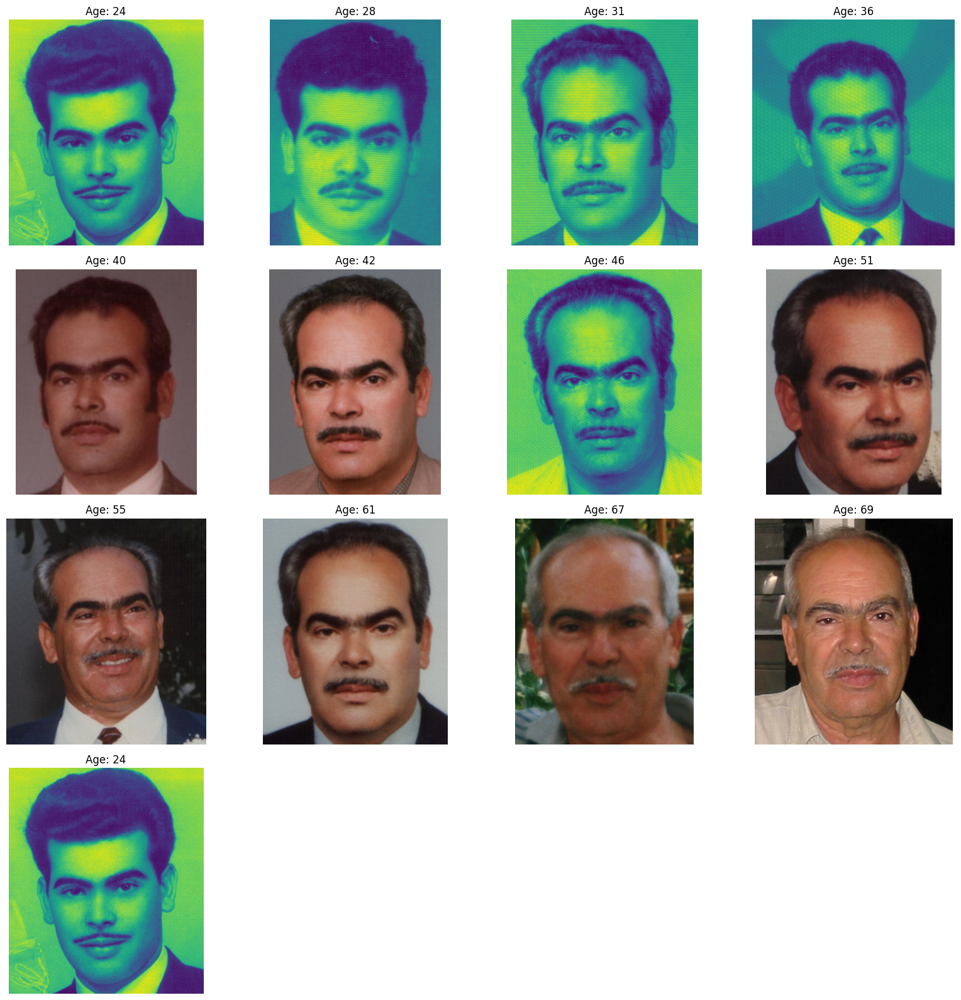

In [88]:
import glob
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Define paths
image_directory = 'FGNET/images'  # Replace with the actual path to your images
csv_file_path = 'facial_landmarks.csv'    # Replace with the path to your CSV file

# Upload an image
# uploaded_image = "002A02.JPG"  # Example of an uploaded image
uploaded_image = "006A24.JPG"
# Load the CSV file
df = pd.read_csv(csv_file_path)

# Extract image filenames from the CSV (assuming the column name is 'image_file')
csv_image_filenames = df['image_file'].tolist()

# Function to extract the 2nd and 3rd digits from the filename
def extract_digits(filename):
    return filename[1:3]

# Function to extract age from the 5th and 6th digits of the filename
def extract_age(filename):
    return filename[4:6]

# Extract digits from the uploaded image
uploaded_digits = extract_digits(uploaded_image)

# Filter images with the same 2nd and 3rd digits
filtered_images = [img for img in csv_image_filenames if extract_digits(img) == uploaded_digits]
filtered_images.append(uploaded_image)  # Include the uploaded image

# Function to display images along with their ages
def display_images_with_age(image_list, img_dir):
    cols = 4  # Number of columns
    rows = len(image_list) // cols + (len(image_list) % cols > 0)  # Calculate rows needed

    plt.figure(figsize=(cols * 4, rows * 4))  # Adjust figure size based on number of images
    
    for idx, img_name in enumerate(image_list):
        img_path = os.path.join(img_dir, img_name)
        if os.path.exists(img_path):
            img = Image.open(img_path)
            plt.subplot(rows, cols, idx + 1)
            plt.imshow(img)
            # Extract age from filename and display it in the title
            age = extract_age(img_name)
            plt.title(f"Age: {age}")
            plt.axis('off')  # Hide axis for clean display
    
    plt.tight_layout()
    plt.show()

# Display filtered images along with their ages
display_images_with_age(filtered_images, image_directory)




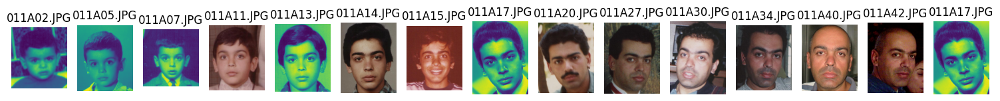

In [89]:
def display_images(image_list, img_dir):
    plt.figure(figsize=(15, 15))  # Adjust as needed based on the number of images
    
    for idx, img_name in enumerate(image_list):
        img_path = os.path.join(img_dir, img_name)
        if os.path.exists(img_path):
            img = Image.open(img_path)
            plt.subplot(1, len(image_list), idx + 1)  # Adjust grid based on the number of images
            plt.imshow(img)
            plt.title(img_name)
            plt.axis('off')  # Hide axis for clean display
    
    plt.tight_layout()
    plt.show()

# Display filtered and sorted images
display_images(sorted_images, image_directory)

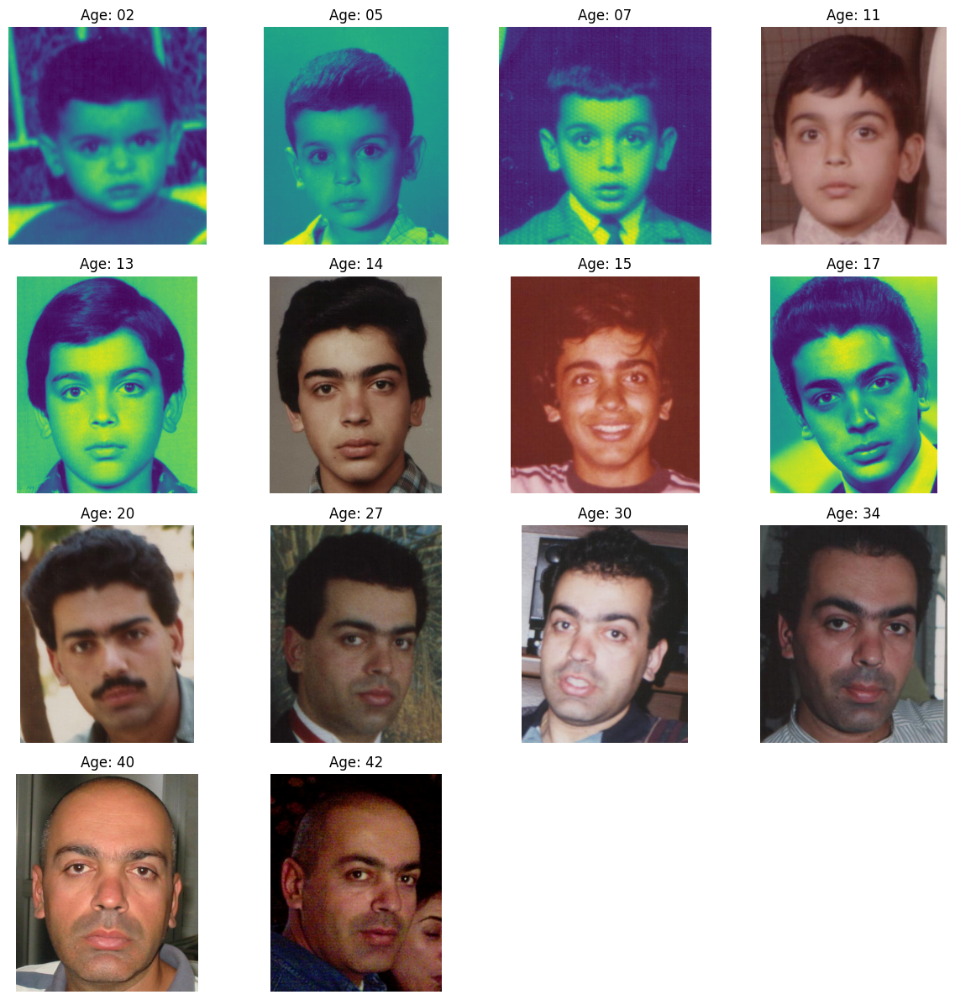

In [90]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Define paths and uploaded image
image_directory = 'FGNET/images'  # Replace with the actual path to your images
csv_file_path = 'facial_landmarks.csv'   # Replace with your CSV file path
# uploaded_image = "002A02.JPG"  # Uploaded image example

# uploaded_image = "002A02.JPG"  # Example of an uploaded image
# uploaded_image = "006A24.JPG"
# uploaded_image = "010A06.JPG"
# uploaded_image = "009A22b.JPG"
uploaded_image = "011A17.JPG"
# Load CSV and image filenames
df = pd.read_csv(csv_file_path)
csv_image_filenames = df['image_file'].tolist()

# Extract digits and age from filename
extract_digits = lambda x: x[1:3]
extract_age = lambda x: x[4:6]

# Filter and add the uploaded image if not in the list
uploaded_digits = extract_digits(uploaded_image)
filtered_images = [img for img in csv_image_filenames if extract_digits(img) == uploaded_digits]
if uploaded_image not in filtered_images:
    filtered_images.append(uploaded_image)

# Display images with ages
plt.figure(figsize=(12, len(filtered_images) // 4 * 4))
for idx, img_name in enumerate(filtered_images):
    img_path = os.path.join(image_directory, img_name)
    if os.path.exists(img_path):
        img = Image.open(img_path)
        plt.subplot(len(filtered_images) // 4 + 1, 4, idx + 1)
        plt.imshow(img)
        plt.title(f"Age: {extract_age(img_name)}")
        plt.axis('off')
plt.tight_layout()
plt.show()


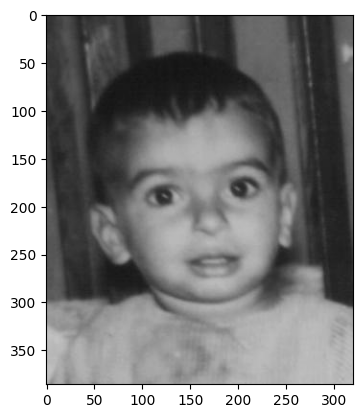

In [91]:
from PIL import Image
import matplotlib.pyplot as plt

def load_image(image_folder, image_name):
    img_path = os.path.join(image_folder, image_name)
    img = Image.open(img_path).convert('RGB')
    return img

# Example usage:
image_folder = 'FGNET/images/'  # Replace with your actual image folder
image_name = '001A02.JPG'  # Replace with actual image file name
image = load_image(image_folder, image_name)

# Display the image
plt.imshow(image)
plt.show()


# Multi-task Vision Transformer model

In [173]:
import tensorflow as tf
from keras import layers
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import keras
from keras import ops
import pandas as pd
import numpy as np
import random

# Model configuration

In [174]:
# Dataset values
IMAGE_SIZE = 284

# Model configs
patch_size = 32
input_shape = (IMAGE_SIZE, IMAGE_SIZE, 3)  # input image shape
learning_rate = 0.001
weight_decay = 0.0001
batch_size = 256
num_epochs = 50
num_patches = (IMAGE_SIZE // patch_size) ** 2
projection_dim = 64
num_heads = 4
age_k = 3

# Transformer layers
transformer_units = [
    projection_dim * 2,
    projection_dim,
]
transformer_layers = 4

# MLP units
mlp_head_units = [2048, 1024, 512, 64, 32]


# FaceVit losses and metrics
facevit_losses = {
    "age": keras.losses.MeanSquaredError(),
}

facevit_metrics = {
    "age": [keras.metrics.MeanAbsoluteError()],
}

def model_compiler(model, optimizer, loss, metrics):
    "Model compilation function"
    model.compile(optimizer= optimizer, loss= loss, metrics = metrics)
    return model

# Load and prepare dataset

### Pre-processing

In [175]:
def create_age_bins_and_encode(df,
                               bin_size=2,
                               max_age = 100,
                               json_output_path='age/age_bins.json',
                               write_json = True):
    """
    Function to bin ages into configurable intervals, encode the bins, and save the encoding dictionary in JSON format.

    Parameters:
    df (pd.DataFrame): DataFrame containing the age column.
    bin_size (int): Size of each age bin (default is 5 years).
    json_output_path (str): Path to save the JSON dictionary mapping age bins to encoded labels.

    Returns:
    pd.DataFrame: DataFrame with an additional column for encoded age bins.
    """
    import json
    from sklearn.preprocessing import LabelEncoder

    # Define the age bins and bin labels
    bins = range(0, max_age, bin_size)
    labels = [f'{i}-{i + bin_size - 1}' for i in range(0, max_age- bin_size, bin_size)]

    # Bin the ages
    df['age_bin'] = pd.cut(df['age'], bins=bins, labels=labels, right=False)

    # Encode the age bins into class indexes
    label_encoder = LabelEncoder()
    df['age_class'] = label_encoder.fit_transform(df['age_bin'])
    age_bin_mapping = dict(zip(df['age_bin'], df['age_class']))

    # Save the dictionary as a JSON file
    if write_json:
        with open(json_output_path, 'w') as json_file:
            json.dump(age_bin_mapping, json_file)

    return df, len(age_bin_mapping)

### Augmentations pipeline

In [176]:
def apply_color_augmentation(image):
    augmentations = [
        lambda img: tf.image.random_brightness(img, max_delta=0.2),
        lambda img: tf.image.random_contrast(img, lower=0.5, upper=1.5),
        lambda img: tf.image.random_saturation(img, lower=0.5, upper=1.5),
        lambda img: tf.image.random_hue(img, max_delta=0.2)
    ]

    # Randomly select 2 augmentations to apply
    chosen_augmentations = random.sample(augmentations, 2)

    for aug in chosen_augmentations:
        image = aug(image)

    # Ensure values remain within 0 and 1
    image = tf.clip_by_value(image, 0.0, 1.0)

    return image

def apply_augmentations_fn(images, ground_truth):
    """Only color based augmentatios are used for simplicity"""
    # Apply some simple color augmentations to the images
    augmented_images = tf.map_fn(apply_color_augmentation, images)
    return augmented_images, ground_truth

### Dataset builder

In [177]:
import pandas as pd
import tensorflow as tf

def create_tf_dataset(csv_file, images_dir, batch_size, target_size=(284, 284), augment=False, write_json=True):
    # Read the CSV file
    df = pd.read_csv(csv_file)

    # Debugging: Check the shape and columns of the DataFrame
    # print("Shape of DataFrame: ", df.shape)
    # print("Available columns: ", df.columns)

    # Define the points columns dynamically
    pts_columns = [f'pts_{i:02d}_x' for i in range(1, 69)] + [f'pts_{i:02d}_y' for i in range(1, 69)]

    # Ensure the columns exist
    if 'image_file' not in df.columns:
        raise ValueError("The 'image_file' column is missing from the CSV.")
    if 'age' not in df.columns:
        raise ValueError("The 'age' column is missing from the CSV.")
    
    # Add the specified columns
    df['image_file'] = images_dir + '/' + df['image_file']
    required_columns = ['image_file']  
    age_column = ['age']  

    # Final list of columns combining the specified ones and the generated points columns
    final_columns = required_columns + pts_columns + age_column

    # Check if all the required columns are in the DataFrame
    missing_columns = [col for col in final_columns if col not in df.columns]
    if missing_columns:
        raise ValueError(f"Missing columns in DataFrame: {missing_columns}")

    # Select only the final columns from the DataFrame
    df = df[final_columns]

    # Create the age bin with bins per 4 years for classification task
    df, num_age_groups = create_age_bins_and_encode(df, bin_size=2, write_json=write_json)

    # Ensure num_age_groups is an int32
    num_age_groups = int(num_age_groups)

    def load_and_preprocess_image(img_path, age):
        # Load image
        img = tf.io.read_file(img_path)
        img = tf.image.decode_jpeg(img, channels=3)

        # Resize and normalize
        img = tf.image.resize(img, target_size)
        img = tf.cast(img, tf.float32) / 255.0

        # Convert age to tensors
        age_tensor = tf.cast(tf.convert_to_tensor(age), dtype=tf.int32)
        age_tensor = tf.one_hot(age_tensor, depth=num_age_groups)

        # Debugging: Print shapes

        return img, age_tensor

    # Create TensorFlow dataset from DataFrame
    dataset = tf.data.Dataset.from_tensor_slices((
        df['image_file'].values, 
        df['age'].values
    ))

    # Load and preprocess images in parallel
    dataset = dataset.map(lambda img_path, age: load_and_preprocess_image(img_path, age), num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # Batch the dataset
    dataset = dataset.batch(batch_size, drop_remainder=True)

    if augment:
        dataset = dataset.map(apply_augmentations_fn, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    return dataset, num_age_groups


# Splits

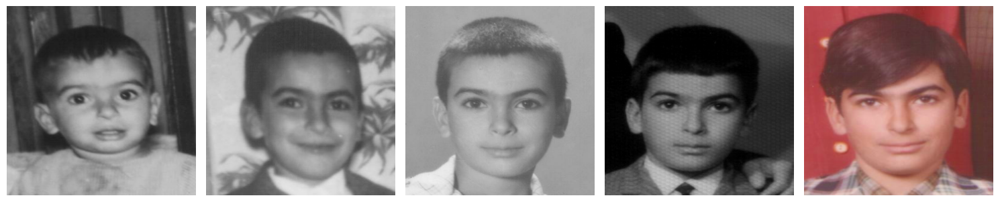

In [178]:
# Define paths and parameters
train_csv = 'updated_csv_file.csv'
images_dir = 'FGNET\images'


# Create the dataset
train_dataset, num_age_groups = create_tf_dataset(train_csv, images_dir, batch_size, augment= True)


# Example usage (iterating over the dataset)
for batch in train_dataset:
    images, y_true = batch
    ages = y_true

    

    # Plot the first five images and their corresponding ages
    plt.figure(figsize=(15, 10))
    for i in range(5):
        img = images[i].numpy()
        img = (img * 255).astype('uint8')  # Convert back to uint8 for display

        plt.subplot(2, 5, i + 1)
        plt.imshow(img)
        # plt.title(f'Age: {tf.argmax(ages[i]).numpy()}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    break

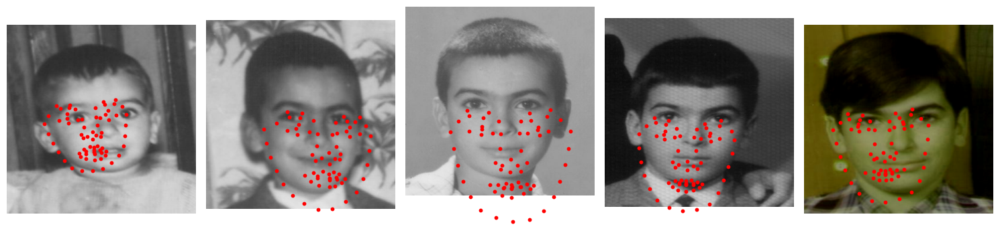

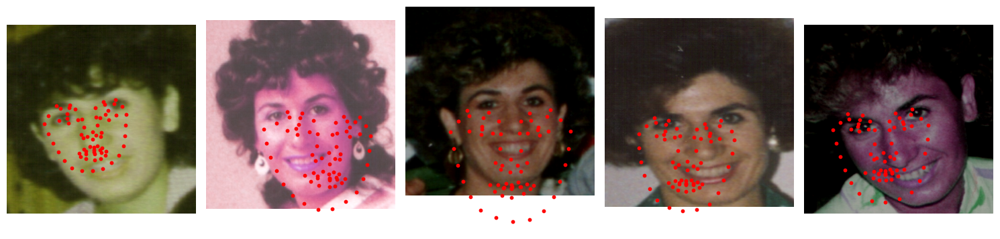

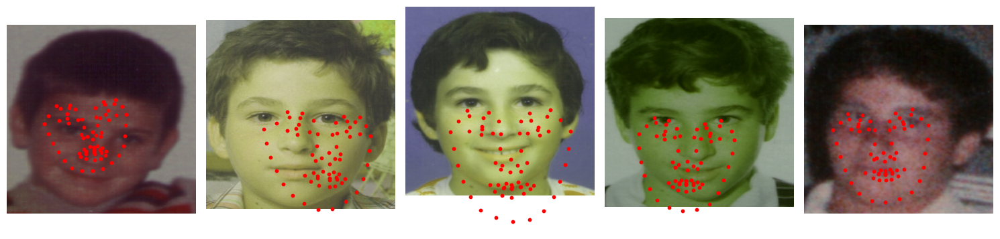

In [180]:
import matplotlib.pyplot as plt

# Define paths and parameters
train_csv = 'updated_csv_file.csv'
images_dir = 'FGNET/images'
# batch_size = 32  # Specify your batch size
df = pd.read_csv(train_csv)
# Create the dataset
train_dataset, num_age_groups = create_tf_dataset(train_csv, images_dir, batch_size, augment=True)

# Example usage (iterating over the dataset)
for batch in train_dataset:
    images, y_true = batch
    ages = y_true

    # Get the points (landmarks) for the first batch
    points = df.iloc[0:batch_size, 1:-1].values  # Adjust index as needed (1:-1 to exclude image_file and age)

    # Define the original dimensions of the images the points were based on
    original_img_size = (384, 384)  # This size might vary; adjust accordingly based on your data

    # Plot the first five images, their corresponding ages, and points
    plt.figure(figsize=(15, 10))
    for i in range(5):
        img = images[i].numpy()
        img = (img * 255).astype('uint8')  # Convert back to uint8 for display

        # Current image dimensions (284x284)
        current_img_size = (284, 284)
        
        # Calculate scaling factors
        scale_x = current_img_size[1] / original_img_size[1]
        scale_y = current_img_size[0] / original_img_size[0]

        plt.subplot(2, 5, i + 1)
        plt.imshow(img)
        plt.axis('off')

        # Plot landmarks with scaling
        for j in range(0, len(points[i]), 2):  # Step by 2 to get x and y coordinates
            x = points[i][j] * scale_x  # Scale the x-coordinate
            y = points[i][j + 1] * scale_y  # Scale the y-coordinate
            plt.scatter(x, y, color='red', s=10)  # Plot the point

    plt.tight_layout()
    plt.show()

    # break


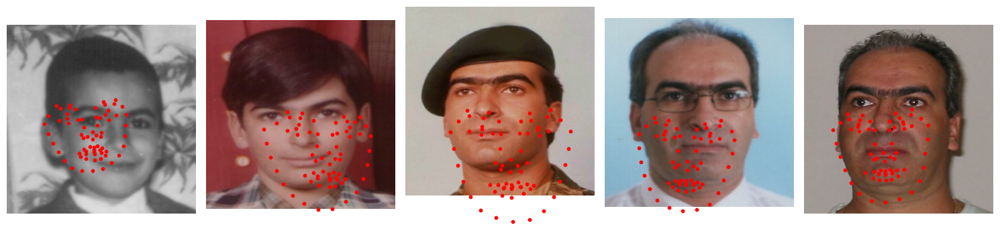

In [181]:
# Define paths and parameters
val_csv = 'remaining_500_rows.csv'
images_dir = 'test'

# Create the dataset
val_dataset, _ = create_tf_dataset(val_csv, images_dir, batch_size, write_json = False)

# Example usage (iterating over the dataset)
for batch in val_dataset:
    images, y_true = batch
    ages = y_true

    # Get the points (landmarks) for the first batch
    points = df.iloc[0:batch_size, 1:-1].values  # Adjust index as needed (1:-1 to exclude image_file and age)

    # Define the original dimensions of the images the points were based on
    original_img_size = (384, 384)  # This size might vary; adjust accordingly based on your data

    # Plot the first five images, their corresponding ages, and points
    plt.figure(figsize=(15, 10))
    for i in range(5):
        img = images[i].numpy()
        img = (img * 255).astype('uint8')  # Convert back to uint8 for display

        # Current image dimensions (284x284)
        current_img_size = (284, 284)
        
        # Calculate scaling factors
        scale_x = current_img_size[1] / original_img_size[1]
        scale_y = current_img_size[0] / original_img_size[0]

        plt.subplot(2, 5, i + 1)
        plt.imshow(img)
        plt.axis('off')

        # Plot landmarks with scaling
        for j in range(0, len(points[i]), 2):  # Step by 2 to get x and y coordinates
            x = points[i][j] * scale_x  # Scale the x-coordinate
            y = points[i][j + 1] * scale_y  # Scale the y-coordinate
            plt.scatter(x, y, color='red', s=10)  # Plot the point

    plt.tight_layout()
    plt.show()

    break

# FaceVit model 

In [160]:
def mlp(x, hidden_units, dropout_rate, block_name):
    """Simple MLP with dropout"""
    for i in range(len(hidden_units)):
        x = layers.Dense(hidden_units[i], activation=keras.activations.gelu, name= f'Dense_{i}_{block_name}')(x)
        x = layers.Dropout(dropout_rate, name = f'Dropout_{i}_{block_name}')(x)
    return x

class Patches(layers.Layer):
    def __init__(self, patch_size, name):
        super().__init__()
        self.patch_size = patch_size
        self.name = name

    def call(self, images):
        input_shape = ops.shape(images)
        batch_size = input_shape[0]
        height = input_shape[1]
        width = input_shape[2]
        channels = input_shape[3]
        num_patches_h = height // self.patch_size
        num_patches_w = width // self.patch_size
        patches = keras.ops.image.extract_patches(images, size=self.patch_size)
        patches = ops.reshape(
            patches,
            (
                batch_size,
                num_patches_h * num_patches_w,
                self.patch_size * self.patch_size * channels,
            ),
        )
        return patches

    def get_config(self):
        config = super().get_config()
        config.update({"patch_size": self.patch_size,
                       'name': self.name})
        return config

class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim, name):
        super().__init__()
        self.num_patches = num_patches
        self.projection = layers.Dense(units=projection_dim)
        self.position_embedding = layers.Embedding(
            input_dim=num_patches, output_dim=projection_dim
        )
        self.name = name

    def call(self, patch):
        positions = ops.expand_dims(
            ops.arange(start=0, stop=self.num_patches, step=1), axis=0
        )
        projected_patches = self.projection(patch)
        encoded = projected_patches + self.position_embedding(positions)
        return encoded
    
class Class_Embeddings(layers.Layer):
    def __init__(self, projection_dim, name=None):
        super(Class_Embeddings, self).__init__(name=name)
        self.projection_dim = projection_dim
        self.age_cls_embedding = self.add_weight(
            shape=(1, 1, projection_dim),
            initializer='random_normal',
            trainable=True,
            name='age_cls_embedding'
        )
        

    def call(self, inputs):
        batch_size = tf.shape(inputs)[0]
        age_cls_embedding = tf.tile(self.age_cls_embedding, [batch_size, 1, 1])
        return age_cls_embedding



def build_facevit(
    input_shape,
    patch_size,
    num_patches,
    projection_dim,
    num_heads,
    transformer_units,
    transformer_layers,
    mlp_head_units,
    age_bins_num
):
    inputs = keras.Input(shape=input_shape, name = 'Input')

    # Create patches
    patches = Patches(patch_size, name = 'Patch_creator')(inputs)
    # Encode patches
    encoded_patches = PatchEncoder(num_patches, projection_dim, name ='Patch_encoder')(patches)

    # Create the class tokens for the classification tasks
    class_tokens = Class_Embeddings(projection_dim, name='Class_Encoder')
    age_cls_embedding = class_tokens(inputs)

    # Pre-pend the tokens to the encoded_patches (age )
    encoded_patches = layers.Concatenate(axis=1, name= 'embed_concat')([age_cls_embedding, encoded_patches])

    # Create multiple layers of the Transformer block.
    for i in range(transformer_layers):
        # Layer normalization 1.
        x1 = layers.LayerNormalization(epsilon=1e-6, name = f'LayerNorm_1_block_{i}')(encoded_patches)
        # Create a multi-head attention layer.
        attention_output = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=projection_dim, dropout=0.1, name = f'MultiHeadAttn_block_{i}'
        )(x1, x1)
        # Skip connection 1.
        x2 = layers.Add(name = f'Skip_1_block_{i}')([attention_output, encoded_patches])
        # Layer normalization 2.
        x3 = layers.LayerNormalization(epsilon=1e-6, name = f'LayerNorm_2_block_{i}')(x2)
        # MLP
        x3 = mlp(x3, hidden_units=transformer_units, dropout_rate=0.1, block_name = f'trans_block_{i}')
        # Skip connection 2.
        encoded_patches = layers.Add(name = f'Skip_2_block_{i}')([x3, x2])

    # Create a [batch_size, projection_dim] tensor.
    representation = layers.LayerNormalization(epsilon=1e-6, name ='LayerNorm_transformed')(encoded_patches)
    representation = layers.Flatten(name = 'Flatten_transformed')(representation[:, 2:, :])
    representation = layers.Dropout(0.3, name = 'Dropout_transformed')(representation)

    # Get the transformed class/age tokens for the classifation tasks
    age_token = encoded_patches[:, 0, :]   

    # Add MLP.
    features_age = mlp(age_token, hidden_units=mlp_head_units, dropout_rate=0.3, block_name= 'MLP_age_out')

    # FaceViT output layers
    age_classifier = layers.Dense(age_bins_num, activation= 'softmax', name= 'age') (features_age)

    return keras.Model(inputs=inputs, outputs=[age_classifier], name = 'FaceVit')

In [161]:
model = build_facevit(input_shape,
                      patch_size,
                      num_patches,
                      projection_dim,
                      num_heads,
                      transformer_units,
                      transformer_layers,
                      mlp_head_units,
                      num_age_groups
                    )
model.summary()

Model: "FaceVit"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Input (InputLayer)  │ (None, 284, 284,  │          0 │ -                 │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Patch_creator       │ (None, 64, 3072)  │          0 │ Input[0][0]       │
│ (Patches)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Class_Encoder       │ (None, 1, 64)     │         64 │ Input[0][0]       │
│ (Class_Embeddings)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Patch_encoder       │ (None, 64, 64)    │    200,768 │ Patch_creator[0]… │
│ (PatchEncoder)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embed_concat        │ (None, 65, 64)    │          0 │ Class_Encoder[0]… │
│ (Concatenate)       │                   │            │ Patch_encoder[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ LayerNorm_1_block_0 │ (None, 65, 64)    │        128 │ embed_concat[0][… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ MultiHeadAttn_bloc… │ (None, 65, 64)    │     66,368 │ LayerNorm_1_bloc… │
│ (MultiHeadAttentio… │                   │            │ LayerNorm_1_bloc… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Skip_1_block_0      │ (None, 65, 64)    │          0 │ MultiHeadAttn_bl… │
│ (Add)               │                   │            │ embed_concat[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ LayerNorm_2_block_0 │ (None, 65, 64)    │        128 │ Skip_1_block_0[0… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Dense_0_trans_bloc… │ (None, 65, 128)   │      8,320 │ LayerNorm_2_bloc… │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Dropout_0_trans_bl… │ (None, 65, 128)   │          0 │ Dense_0_trans_bl… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Dense_1_trans_bloc… │ (None, 65, 64)    │      8,256 │ Dropout_0_trans_… │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Dropout_1_trans_bl… │ (None, 65, 64)    │          0 │ Dense_1_trans_bl… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Skip_2_block_0      │ (None, 65, 64)    │          0 │ Dropout_1_trans_… │
│ (Add)               │                   │            │ Skip_1_block_0[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ LayerNorm_1_block_1 │ (None, 65, 64)    │        128 │ Skip_2_block_0[0… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ MultiHeadAttn_bloc… │ (None, 65, 64)    │     66,368 │ LayerNorm_1_bloc… │
│ (MultiHeadAttentio… │                   │            │ LayerNorm_1_bloc… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Skip_1_block_1      │ (None, 65, 64)    │          0 │ MultiHeadAttn_bl

 Total params: 3,325,729 (12.69 MB)

 Trainable params: 3,325,729 (12.69 MB)

 Non-trainable params: 0 (0.00 B)

# Test patches layer

In [162]:
batch = next(iter(train_dataset))
images, _ = batch
image = images[0] * 255
image = image.numpy()

plt.figure(figsize=(4, 4))
plt.imshow(image.astype("uint8"))
plt.axis("off")

patches = Patches(patch_size, name= 'Patches')(np.expand_dims(image, axis=0))
print(f"Image size: {IMAGE_SIZE} X {IMAGE_SIZE}")
print(f"Patch size: {patch_size} X {patch_size}")
print(f"{patches.shape[1]} patches per image \n{patches.shape[-1]} elements per patch")


n = int(np.sqrt(patches.shape[1]))
plt.figure(figsize=(4, 4))
for i, patch in enumerate(patches[0]):
    ax = plt.subplot(n, n, i + 1)
    patch_img = ops.reshape(patch, (patch_size, patch_size, 3))
    plt.imshow(ops.convert_to_numpy(patch_img).astype("uint8"))
    plt.axis("off")

ValueError: too many values to unpack (expected 2)

# Training function

In [137]:
import pandas as pd

# Load your CSV file
df = pd.read_csv('remaining_500_rows.csv')

# Check unique age bins
unique_age_bins = df['age'].nunique()
print(f'Number of unique age bins in the dataset: {unique_age_bins}')


Number of unique age bins in the dataset: 55


In [138]:
age_mapping = {"0-1": 0, "2-3": 1, "4-5": 2, "6-7": 27, "8-9": 3, "10-11": 5, "12-13": 2, "14-15": 6, "16-17": 7, 
    "18-19": 8, "20-21": 7, "22-23": 9, "24-25": 9, "26-27": 10, "28-29": 11, "30-31": 12, "32-33": 13, 
    "34-35": 14, "36-37": 15, "38-39": 16, "40-41": 18, "42-43": 19, "44-45": 20, "46-47": 21, "48-49": 22, 
    "50-51": 23, "52-53": 24, "54-55": 25, "58-59": 26, "60-61": 28, "62-63": 29, "66-67": 30, "68-69": 31 }  # Ensure all bins are covered.

# Apply the mapping to your dataset's age column.
df['age_bins'] = df['age'].map(age_mapping)


In [145]:
def run_experiment(model, 
                   train_ds, 
                   validation_ds, 
                   learning_rate, 
                   weight_decay,
                   batch_size, 
                   num_epochs,
                   loss_func,
                   metrics):
    optimizer = keras.optimizers.AdamW(
        learning_rate=learning_rate, weight_decay=weight_decay
    )

    # Compile model.
    model = model_compiler(model, optimizer, loss= loss_func, metrics= metrics)

    checkpoint_filepath = "checkpoints/facevit.weights.h5"

    checkpoint_callback = keras.callbacks.ModelCheckpoint(
        checkpoint_filepath,
        monitor="val_loss",
        save_best_only=True,
        save_weights_only=True,
    )

    history = model.fit(
        train_ds,
        batch_size=batch_size,
        epochs=num_epochs,
        validation_data=validation_ds,
        callbacks=[
            checkpoint_callback,
            keras.callbacks.EarlyStopping(monitor="val_loss", patience=10),
        ]
    )

    return history

# Train model
history = run_experiment(
    model,
    train_dataset,
    val_dataset,
    learning_rate, 
    weight_decay, 
    batch_size, 
    num_epochs,
    facevit_losses,
    facevit_metrics
)

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 0.0241 - mean_absolute_error: 0.0535

ValueError: Dimensions must be equal, but are 30 and 33 for '{{node compile_loss/mean_squared_error/sub}} = Sub[T=DT_FLOAT](IteratorGetNext:1, FaceVit_1/age_1/Softmax)' with input shapes: [256,30], [256,33].

In [ ]:
 # Save the model as a .h5 file
model_save_path = "checkpoints/facevit_model.h5"
model.save(model_save_path)

In [1]:
import pandas as pd
import json
import tensorflow as tf

def load_age_bins(json_path='age_bins.json'):
    with open(json_path, 'r') as json_file:
        age_bin_mapping = json.load(json_file)
    return age_bin_mapping

def map_age_to_classes(df, age_bin_mapping):
    # Create a reverse mapping for encoding
    reverse_mapping = {age: index for index, age in enumerate(age_bin_mapping.keys())}
    
    # Map ages to their respective classes using the existing bins
    df['age_class'] = df['age'].map(reverse_mapping)
    
    # if df['age_class'].isnull().any():
    #     raise ValueError("Some ages fall outside the defined bins.")
    
    return df, len(reverse_mapping)

# Create TensorFlow dataset with existing age bins
def create_tf_dataset(csv_file, images_dir, batch_size, target_size=(224, 224), augment=False):
    # Read the CSV file
    df = pd.read_csv(csv_file)

    # Ensure required columns exist
    if 'image_file' not in df.columns or 'age' not in df.columns:
        raise ValueError("The required columns are missing from the CSV.")

    # Update image file paths
    df['image_file'] = images_dir + '/' + df['image_file']

    # Load existing age bins
    age_bin_mapping = load_age_bins()

    # Map ages to their respective classes
    df, num_age_groups = map_age_to_classes(df, age_bin_mapping)

    def load_and_preprocess_image(img_path, age):
        # Load image
        img = tf.io.read_file(img_path)
        img = tf.image.decode_jpeg(img, channels=3)
        
        # Resize and normalize
        img = tf.image.resize(img, target_size)
        img = tf.cast(img, tf.float32) / 255.0

        # Convert age to tensor (keep as integer for sparse_categorical_crossentropy)
        age_tensor = tf.cast(age, dtype=tf.int32)

        return img, age_tensor

    # Create TensorFlow dataset
    dataset = tf.data.Dataset.from_tensor_slices((df['image_file'].values, df['age_class'].values))

    # Map the loading and preprocessing function
    dataset = dataset.map(lambda img_path, age: load_and_preprocess_image(img_path, age), 
                          num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # Batch the dataset
    dataset = dataset.batch(batch_size, drop_remainder=True)

    if augment:
        dataset = dataset.map(apply_augmentations_fn, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    return dataset, num_age_groups


# Accurancy

In [92]:
import pandas as pd
import matplotlib.pyplot as plt

def create_metrics_table(history, epochs):
    # Assuming history.history is a dictionary
    top_3_age_accuracy = np.max(history.history['val_age_top_3_accuracy']) * 100
    face_mse = np.min(history.history['val_face_mse'])
    gender_accuracy = np.max(history.history['val_gender_accuracy']) * 100

    # Create the table data
    table_data = {
        'Metric Name': [
            'Top-3 Age Accuracy', 
            'Face Bounding Box MSE', 
            'Gender Accuracy'
        ],
        'Value': [
            f"{top_3_age_accuracy:.2f} %", 
            f"{face_mse:.4f}", 
            f"{gender_accuracy:.2f} %"
        ],
        'Training Epochs': [epochs] * 3
    }

    # Convert to DataFrame
    metrics_table = pd.DataFrame(table_data)

    # Apply styling to the table
    styled_table = metrics_table.style.set_properties(**{'border': '2px solid black', 'text-align': 'center'})

    # Display the styled table
    print("\033[1mTraining Metrics:\033[0m")
    display(styled_table)

# Example usage:
# Assuming you have the history object and the number of epochs is 43
create_metrics_table(history, epochs=40)


Training Metrics:


,Metric Name,Value,Training Epochs
0,Top-3 Age Accuracy,93.80 %,40
1,Face Bounding Box MSE,0.0098,40
2,Gender Accuracy,91.40 %,40


# Plot loss

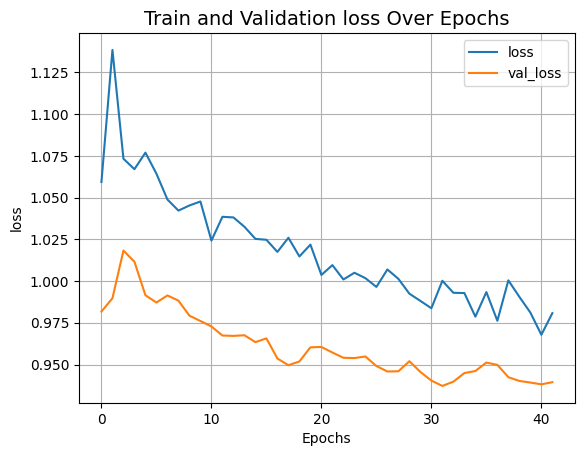

In [19]:
def plot_history(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()

plot_history("loss")

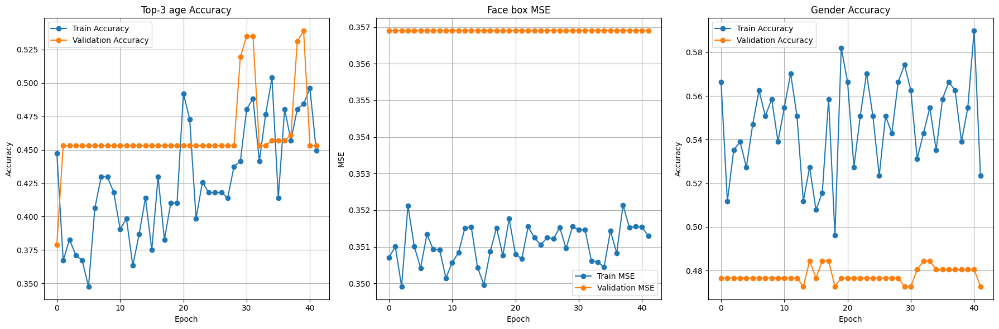

In [20]:
def plot_metrics(history):
    history = history.history
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Plot age accuracy
    axes[0].plot(history[f'age_top_{age_k}_accuracy'], label='Train Accuracy', marker='o')
    axes[0].plot(history[f'val_age_top_{age_k}_accuracy'], label='Validation Accuracy', marker='o')
    axes[0].set_title(f'Top-{age_k} age Accuracy')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')
    axes[0].legend()
    axes[0].grid(True)

    # Plot face mse
    axes[1].plot(history['face_mse'], label='Train MSE', marker='o')
    axes[1].plot(history['val_face_mse'], label='Validation MSE', marker='o')
    axes[1].set_title('Face box MSE')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('MSE')
    axes[1].legend()
    axes[1].grid(True)

    # Plot gender accuracy
    axes[2].plot(history['gender_accuracy'], label='Train Accuracy', marker='o')
    axes[2].plot(history['val_gender_accuracy'], label='Validation Accuracy', marker='o')
    axes[2].set_title('Gender Accuracy')
    axes[2].set_xlabel('Epoch')
    axes[2].set_ylabel('Accuracy')
    axes[2].legend()
    axes[2].grid(True)

    plt.tight_layout()
    plt.show()

plot_metrics(history)

# Test

In [2]:
import tensorflow as tf
from keras import layers
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import keras
from keras import ops
import pandas as pd
import numpy as np
import random

In [3]:
# Dataset values
IMAGE_SIZE = 384

# Model configs
patch_size = 32
input_shape = (IMAGE_SIZE, IMAGE_SIZE, 3)  # input image shape
learning_rate = 0.001
weight_decay = 0.0001
batch_size = 256
num_epochs = 40
num_patches = (IMAGE_SIZE // patch_size) ** 2
projection_dim = 64
num_heads = 4
age_k = 3

# Transformer layers
transformer_units = [
    projection_dim * 2,
    projection_dim,
]
transformer_layers = 4

# MLP units
mlp_head_units = [2048, 1024, 512, 64, 32]


# FaceVit losses and metrics
facevit_losses = {
    "face": keras.losses.MeanSquaredError(),
    "gender": keras.losses.BinaryCrossentropy(),
    "age": keras.losses.CategoricalFocalCrossentropy()
}

facevit_metrics = {
    "face": 'mse',
    "gender": 'accuracy',
    "age": tf.keras.metrics.TopKCategoricalAccuracy(k=age_k, name=f'top_{age_k}_accuracy', dtype=None)
}

def model_compiler(model, optimizer, loss, metrics):
    "Model compilation function"
    model.compile(optimizer= optimizer, loss= loss, metrics = metrics)
    return model

In [4]:
def create_age_bins_and_encode(df,
                               bin_size=5,
                               max_age = 100,
                               json_output_path='age/age_bins.json',
                               write_json = True):
    """
    Function to bin ages into configurable intervals, encode the bins, and save the encoding dictionary in JSON format.

    Parameters:
    df (pd.DataFrame): DataFrame containing the age column.
    bin_size (int): Size of each age bin (default is 5 years).
    json_output_path (str): Path to save the JSON dictionary mapping age bins to encoded labels.

    Returns:
    pd.DataFrame: DataFrame with an additional column for encoded age bins.
    """
    import json
    from sklearn.preprocessing import LabelEncoder

    # Define the age bins and bin labels
    bins = range(0, max_age, bin_size)
    labels = [f'{i}-{i + bin_size - 1}' for i in range(0, max_age- bin_size, bin_size)]

    # Bin the ages
    df['age_bin'] = pd.cut(df['age'], bins=bins, labels=labels, right=False)

    # Encode the age bins into class indexes
    label_encoder = LabelEncoder()
    df['age_class'] = label_encoder.fit_transform(df['age_bin'])
    age_bin_mapping = dict(zip(df['age_bin'], df['age_class']))

    # Save the dictionary as a JSON file
    if write_json:
        with open(json_output_path, 'w') as json_file:
            json.dump(age_bin_mapping, json_file)

    return df, len(age_bin_mapping)

In [5]:
def apply_color_augmentation(image):
    augmentations = [
        lambda img: tf.image.random_brightness(img, max_delta=0.2),
        lambda img: tf.image.random_contrast(img, lower=0.5, upper=1.5),
        lambda img: tf.image.random_saturation(img, lower=0.5, upper=1.5),
        lambda img: tf.image.random_hue(img, max_delta=0.2)
    ]

    # Randomly select 2 augmentations to apply
    chosen_augmentations = random.sample(augmentations, 2)

    for aug in chosen_augmentations:
        image = aug(image)

    # Ensure values remain within 0 and 1
    image = tf.clip_by_value(image, 0.0, 1.0)

    return image

def apply_augmentations_fn(images, ground_truth):
    """Only color based augmentatios are used for simplicity"""
    # Apply some simple color augmentations to the images
    augmented_images = tf.map_fn(apply_color_augmentation, images)
    return augmented_images, ground_truth

In [6]:
def create_tf_dataset(csv_file, images_dir, batch_size, target_size=(384, 384), augment=False, write_json = True):
    # Read the CSV file
    df = pd.read_csv(csv_file)

    # Convert gender to 0 for male and 1 for female
    df['gender'] = df['gender'].map({'M': 0, 'F': 1})

    # Extract relevant columns (age, gender, and face bounding box)
    df = df[['img_name','age', 'gender', 'face_x0', 'face_y0', 'face_x1', 'face_y1']]

    # Create file paths for images
    df['img_path'] = images_dir + '/' + df['img_name']

    # Convert box to numeric
    df['face_x0'] = pd.to_numeric(df['face_x0'])
    df['face_y0'] = pd.to_numeric(df['face_y0'])
    df['face_x1'] = pd.to_numeric(df['face_x1'])
    df['face_y1'] = pd.to_numeric(df['face_y1'])

    # Create the age bin with bins per 5 years for classification task
    # Save the labels dictionary to a json file for decoding predictions
    df, num_age_groups = create_age_bins_and_encode(df, bin_size=5, write_json = write_json)

    def load_and_preprocess_image(img_path, age, gender, face_x0, face_y0, face_x1, face_y1, age_groups_n = num_age_groups):
        # Load image
        img = tf.io.read_file(img_path)
        img = tf.image.decode_jpeg(img, channels=3)

        # Get original width and height before resizing to scale the boxes
        original_height = tf.cast(tf.shape(img)[0], dtype=tf.int64)
        original_width = tf.cast(tf.shape(img)[1], dtype=tf.int64)

        # Rescale/normalize bounding box coordinates
        face_x0_scaled = face_x0 / original_width
        face_y0_scaled = face_y0 / original_height
        face_x1_scaled = face_x1 / original_width
        face_y1_scaled = face_y1 / original_height

        # Resize and normalize
        img = tf.image.resize(img, target_size)
        img = tf.cast(img, tf.float32) / 255.0

        # Concatenate normalized coordinates
        bounding_box = tf.convert_to_tensor([face_x0_scaled, face_y0_scaled,
                                            face_x1_scaled, face_y1_scaled])

        # Convert gender and age to tensors
        gender_tensor = tf.cast(tf.convert_to_tensor(gender), dtype=tf.int32)
        age_tensor = tf.cast(tf.convert_to_tensor(age), dtype=tf.int32)
        age_tensor = tf.one_hot(age_tensor, depth=age_groups_n)

        # Return image and concatenated ground truth tensor
        return img, (bounding_box, gender_tensor, age_tensor)


    # Create TensorFlow dataset from DataFrame
    dataset = tf.data.Dataset.from_tensor_slices((
        df['img_path'].values,
        df['age_class'].values,
        df['gender'].values,
        df['face_x0'].values,
        df['face_y0'].values,
        df['face_x1'].values,
        df['face_y1'].values
    ))

    # Load and preprocess images in parallel
    dataset = dataset.map(load_and_preprocess_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # Batch the dataset
    dataset = dataset.batch(batch_size, drop_remainder= True)

    if augment:
        dataset = dataset.map(apply_augmentations_fn, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    return dataset, num_age_groups

In [7]:
train_csv = 'dataset/train.csv'
images_dir = 'dataset/utk_train/train'


# Create the dataset
train_dataset, num_age_groups = create_tf_dataset(train_csv, images_dir, batch_size, augment= True)

In [8]:
def mlp(x, hidden_units, dropout_rate, block_name):
    """Simple MLP with dropout"""
    for i in range(len(hidden_units)):
        x = layers.Dense(hidden_units[i], activation=keras.activations.gelu, name= f'Dense_{i}_{block_name}')(x)
        x = layers.Dropout(dropout_rate, name = f'Dropout_{i}_{block_name}')(x)
    return x

class Patches(layers.Layer):
    def __init__(self, patch_size, name):
        super().__init__()
        self.patch_size = patch_size
        self.name = name

    def call(self, images):
        input_shape = ops.shape(images)
        batch_size = input_shape[0]
        height = input_shape[1]
        width = input_shape[2]
        channels = input_shape[3]
        num_patches_h = height // self.patch_size
        num_patches_w = width // self.patch_size
        patches = keras.ops.image.extract_patches(images, size=self.patch_size)
        patches = ops.reshape(
            patches,
            (
                batch_size,
                num_patches_h * num_patches_w,
                self.patch_size * self.patch_size * channels,
            ),
        )
        return patches

    def get_config(self):
        config = super().get_config()
        config.update({"patch_size": self.patch_size,
                       'name': self.name})
        return config

class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim, name):
        super().__init__()
        self.num_patches = num_patches
        self.projection = layers.Dense(units=projection_dim)
        self.position_embedding = layers.Embedding(
            input_dim=num_patches, output_dim=projection_dim
        )
        self.name = name

    # Override function to avoid error while saving model
    def get_config(self):
        config = super().get_config().copy()
        config.update(
            {   "name": self.name,
                "input_shape": input_shape,
                "patch_size": patch_size,
                "num_patches": num_patches,
                "projection_dim": projection_dim,
                "num_heads": num_heads,
                "transformer_units": transformer_units,
                "transformer_layers": transformer_layers,
                "mlp_head_units": mlp_head_units,
            }
        )
        return config

    def call(self, patch):
        positions = ops.expand_dims(
            ops.arange(start=0, stop=self.num_patches, step=1), axis=0
        )
        projected_patches = self.projection(patch)
        encoded = projected_patches + self.position_embedding(positions)
        return encoded
    
class Class_Embeddings(layers.Layer):
    def __init__(self, projection_dim, name=None):
        super(Class_Embeddings, self).__init__(name=name)
        self.projection_dim = projection_dim
        self.age_cls_embedding = self.add_weight(
            shape=(1, 1, projection_dim),
            initializer='random_normal',
            trainable=True,
            name='age_cls_embedding'
        )
        self.gender_cls_embedding = self.add_weight(
            shape=(1, 1, projection_dim),
            initializer='random_normal',
            trainable=True,
            name='gender_cls_embedding'
        )

    def call(self, inputs):
        batch_size = tf.shape(inputs)[0]
        age_cls_embedding = tf.tile(self.age_cls_embedding, [batch_size, 1, 1])
        gender_cls_embedding = tf.tile(self.gender_cls_embedding, [batch_size, 1, 1])
        return age_cls_embedding, gender_cls_embedding
    
def build_facevit(
    input_shape,
    patch_size,
    num_patches,
    projection_dim,
    num_heads,
    transformer_units,
    transformer_layers,
    mlp_head_units,
    age_bins_num
):
    inputs = keras.Input(shape=input_shape, name = 'Input')

    # Create patches
    patches = Patches(patch_size, name = 'Patch_creator')(inputs)
    # Encode patches
    encoded_patches = PatchEncoder(num_patches, projection_dim, name ='Patch_encoder')(patches)

    # Create the class tokens for the classification tasks
    class_tokens = Class_Embeddings(projection_dim, name='Class_Encoder')
    age_cls_embedding, gender_cls_embedding = class_tokens(inputs)

    # Pre-pend the tokens to the encoded_patches (age then gender)
    encoded_patches = layers.Concatenate(axis=1, name= 'embed_concat')([age_cls_embedding, gender_cls_embedding, encoded_patches])

    # Create multiple layers of the Transformer block.
    for i in range(transformer_layers):
        # Layer normalization 1.
        x1 = layers.LayerNormalization(epsilon=1e-6, name = f'LayerNorm_1_block_{i}')(encoded_patches)
        # Create a multi-head attention layer.
        attention_output = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=projection_dim, dropout=0.1, name = f'MultiHeadAttn_block_{i}'
        )(x1, x1)
        # Skip connection 1.
        x2 = layers.Add(name = f'Skip_1_block_{i}')([attention_output, encoded_patches])
        # Layer normalization 2.
        x3 = layers.LayerNormalization(epsilon=1e-6, name = f'LayerNorm_2_block_{i}')(x2)
        # MLP
        x3 = mlp(x3, hidden_units=transformer_units, dropout_rate=0.1, block_name = f'trans_block_{i}')
        # Skip connection 2.
        encoded_patches = layers.Add(name = f'Skip_2_block_{i}')([x3, x2])

    # Create a [batch_size, projection_dim] tensor.
    representation = layers.LayerNormalization(epsilon=1e-6, name ='LayerNorm_transformed')(encoded_patches)
    representation = layers.Flatten(name = 'Flatten_transformed')(representation[:, 2:, :])
    representation = layers.Dropout(0.3, name = 'Dropout_transformed')(representation)

    # Get the transformed class/age tokens for the classifation tasks
    age_token = encoded_patches[:, 0, :]   
    gender_token = encoded_patches[:, 1, :]

    # Add MLP.
    features_box = mlp(representation, hidden_units=mlp_head_units, dropout_rate=0.3, block_name= 'MLP_box_out')
    features_age = mlp(age_token, hidden_units=mlp_head_units, dropout_rate=0.3, block_name= 'MLP_age_out')
    features_gender = mlp(gender_token, hidden_units=mlp_head_units, dropout_rate=0.3, block_name= 'MLP_gender_out')

    # FaceViT output layers
    face_box = layers.Dense(4, activation = 'sigmoid', name="face")(features_box)
    gender_classifier = layers.Dense(1, activation='sigmoid', name = 'gender')(features_gender)
    age_classifier = layers.Dense(age_bins_num, activation= 'softmax', name= 'age') (features_age)

    return keras.Model(inputs=inputs, outputs=[face_box, gender_classifier, age_classifier], name = 'FaceVit')


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 963ms/step


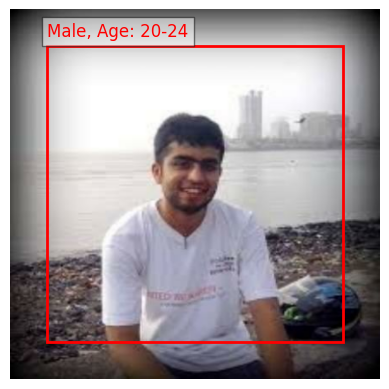

In [9]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import json

# Load the trained model
checkpoint_filepath = "checkpoints/facevit_model.h5"
model = build_facevit(
    input_shape,          # Define the input shape
    patch_size,           # Define the patch size
    num_patches,          # Define the number of patches
    projection_dim,       # Define the projection dimension
    num_heads,            # Define the number of attention heads
    transformer_units,    # Define the transformer units
    transformer_layers,   # Define the number of transformer layers
    mlp_head_units,       # Define the MLP head units
    num_age_groups        # Define the number of age groups
)
model.load_weights(checkpoint_filepath)

def preprocess_image(image_path, target_size=(384, 384)):
    # Load and preprocess image
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, target_size)
    img = tf.cast(img, tf.float32) / 255.0
    img = tf.expand_dims(img, axis=0)  # Add batch dimension
    return img

def get_gender_and_age_bin_from_csv(image_path, csv_paths, age_bin_mapping):
    # Extract image name from path
    img_name = image_path.split('/')[-1]

    # Load and merge CSV files
    df_list = [pd.read_csv(csv_path) for csv_path in csv_paths]
    df = pd.concat(df_list, ignore_index=True)

    # Find the row corresponding to the image name
    row = df[df['img_name'] == img_name]

    if not row.empty:
        # Extract gender and age
        gender = row['gender'].values[0]
        age = int(row['age'].values[0])

        # Map gender to 'Male' or 'Female'
        gender_text = 'Male' if gender == 'M' else 'Female'

        # Map age to the corresponding age bin
        age_bin = next((bin for bin, idx in age_bin_mapping.items() if int(bin.split('-')[0]) <= age <= int(bin.split('-')[1])), None)

        return gender_text, age_bin
    else:
        raise ValueError(f"Image name '{img_name}' not found in CSV files.")

# def plot_image_with_predictions(image, bbox, predicted_gender, predicted_age_bin, actual_age_class, age_bin_mapping, image_size=(384, 384, 3)):
#     """Plot image with bounding box, gender, and age predictions."""
#     fig, ax = plt.subplots(1)

#     # Display the image
#     ax.imshow(image)
#     h, w, _ = image_size

#     # Scale bounding box coordinates
#     x1 = int(bbox[0] * w)
#     y1 = int(bbox[1] * h)
#     x2 = int(bbox[2] * w)
#     y2 = int(bbox[3] * h)
#     width = x2 - x1
#     height = y2 - y1

#     # Create a rectangle patch
#     rect = patches.Rectangle((x1, y1), width, height, linewidth=2, edgecolor='r', facecolor='none')
#     ax.add_patch(rect)

#     # Add text for gender and age
#     predicted_text = f'{predicted_gender}, Predicted Age Bin: {predicted_age_bin}'
#     actual_age_text = f'Actual Age Bin: {list(age_bin_mapping.keys())[actual_age_class]}'
#     plt.text(x1, y1 - 10, predicted_text, color='r', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     # plt.text(x1, y1 + height + 20, actual_age_text, color='b', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

#     plt.axis('off')
#     plt.show()

def plot_image_with_predictions(image, bbox, predicted_gender, predicted_age_bin, age_bin_mapping, image_size=(384, 384, 3)):
    """Plot image with bounding box, gender, and age predictions."""
    fig, ax = plt.subplots(1)

    # Display the image
    ax.imshow(image)
    h, w, _ = image_size

    # Scale bounding box coordinates
    x1 = int(bbox[0] * w)
    y1 = int(bbox[1] * h)
    x2 = int(bbox[2] * w)
    y2 = int(bbox[3] * h)
    width = x2 - x1
    height = y2 - y1

    # Create a rectangle patch
    rect = patches.Rectangle((x1, y1), width, height, linewidth=2, edgecolor='r', facecolor='none')
    ax.add_patch(rect)

    # Add text for gender and age
    actual_age_text = f'actual Age: {list(age_bin_mapping.keys())[actual_age_class]}'
    predicted_text = f'{predicted_gender}, Age: {predicted_age_bin}'
    plt.text(x1, y1 - 10, predicted_text, color='r', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
    # plt.text(x1, y1 + height + 20, color='b', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

    plt.axis('off')
    plt.show()

# Paths
# image_path = 'dataset/utk_train/train/56_1_3_20170119211416888.jpg'
# image_path = 'dataset/utk_train/train/21_0_0_20170116215656696.jpg'  # Replace with your image path
# image_path = 'dataset/utk_train/train/56_1_3_20170119211416888.jpg'
# image_path = 'dataset/utk_val/val/40_1_3_20170119165539693.jpg'
# image_path = 'dataset/utk_val/val/21_0_0_20170117141910383.jpg'
# image_path = 'dataset/utk_val/val/34_0_1_20170117141346326.jpg'
# image_path = 'dataset/utk_train/train/36_0_1_20170117163203851.jpg'
# image_path = 'dataset/utk_train/train/56_1_3_20170119211416888.jpg'
image_path = 'dataset/utk_val/val/22_0_3_20170119202650701.jpg'

csv_paths = ['dataset/train.csv', 'dataset/val.csv']  # List of your CSV file paths
age_bin_json_path = 'age/age_bins.json'  # Replace with your age bins JSON file path

# Load age bin mapping from JSON file
with open(age_bin_json_path) as f:
    age_bin_mapping = json.load(f)

# Preprocess the image
input_image = preprocess_image(image_path)

# Get the predicted gender and age bin from the merged CSVs
predicted_gender, predicted_age_bin = get_gender_and_age_bin_from_csv(image_path, csv_paths, age_bin_mapping)

# Make predictions using the trained model
face_box, gender_pred, age_pred = model.predict(input_image)

# Decode predictions
# face_box = face_box[0]  # Remove batch dimension
face_box = [0.1, 0.1, 0.9, 0.9]
gender_pred = gender_pred[0]
age_pred = age_pred[0]

# Convert age prediction to age class
actual_age_class = np.argmax(age_pred)

# Map actual gender
actual_gender = 'Female' if gender_pred > 0.5 else 'Male'

# Convert predictions to numpy arrays
input_image_np = input_image[0].numpy() * 255  # Remove batch dimension and scale back to original range
input_image_np = input_image_np.astype("uint8")

# Visualize the results
plot_image_with_predictions(input_image_np, face_box, predicted_gender, predicted_age_bin, age_bin_mapping)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


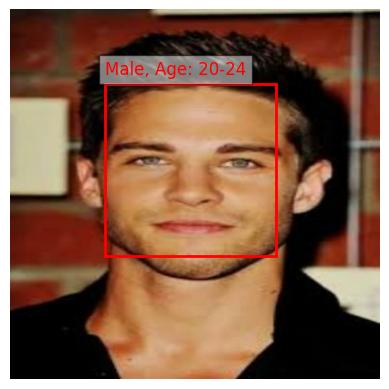

In [10]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import json

# Load the trained model
checkpoint_filepath = "checkpoints/facevit_model.h5"
model = build_facevit(
    input_shape,          # Define the input shape
    patch_size,           # Define the patch size
    num_patches,          # Define the number of patches
    projection_dim,       # Define the projection dimension
    num_heads,            # Define the number of attention heads
    transformer_units,    # Define the transformer units
    transformer_layers,   # Define the number of transformer layers
    mlp_head_units,       # Define the MLP head units
    num_age_groups        # Define the number of age groups
)
model.load_weights(checkpoint_filepath)

def preprocess_image(image_path, target_size=(384, 384)):
    # Load and preprocess image
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, target_size)
    img = tf.cast(img, tf.float32) / 255.0
    img = tf.expand_dims(img, axis=0)  # Add batch dimension
    return img

def get_gender_and_age_bin_from_csv(image_path, csv_paths, age_bin_mapping):
    # Extract image name from path
    img_name = image_path.split('/')[-1]

    # Load and merge CSV files
    df_list = [pd.read_csv(csv_path) for csv_path in csv_paths]
    df = pd.concat(df_list, ignore_index=True)

    # Find the row corresponding to the image name
    row = df[df['img_name'] == img_name]

    if not row.empty:
        # Extract gender and age
        gender = row['gender'].values[0]
        age = int(row['age'].values[0])

        # Map gender to 'Male' or 'Female'
        gender_text = 'Male' if gender == 'M' else 'Female'

        # Map age to the corresponding age bin
        age_bin = next((bin for bin, idx in age_bin_mapping.items() if int(bin.split('-')[0]) <= age <= int(bin.split('-')[1])), None)

        return gender_text, age_bin
    else:
        raise ValueError(f"Image name '{img_name}' not found in CSV files.")

# def plot_image_with_predictions(image, bbox, predicted_gender, predicted_age_bin, actual_age_class, age_bin_mapping, image_size=(384, 384, 3)):
#     """Plot image with bounding box, gender, and age predictions."""
#     fig, ax = plt.subplots(1)

#     # Display the image
#     ax.imshow(image)
#     h, w, _ = image_size

#     # Scale bounding box coordinates
#     x1 = int(bbox[0] * w)
#     y1 = int(bbox[1] * h)
#     x2 = int(bbox[2] * w)
#     y2 = int(bbox[3] * h)
#     width = x2 - x1
#     height = y2 - y1

#     # Create a rectangle patch
#     rect = patches.Rectangle((x1, y1), width, height, linewidth=2, edgecolor='r', facecolor='none')
#     ax.add_patch(rect)

#     # Add text for gender and age
#     predicted_text = f'{predicted_gender}, Predicted Age Bin: {predicted_age_bin}'
#     actual_age_text = f'Actual Age Bin: {list(age_bin_mapping.keys())[actual_age_class]}'
#     plt.text(x1, y1 - 10, predicted_text, color='r', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#     # plt.text(x1, y1 + height + 20, actual_age_text, color='b', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

#     plt.axis('off')
#     plt.show()

def plot_image_with_predictions(image, bbox, predicted_gender, predicted_age_bin, age_bin_mapping, image_size=(384, 384, 3)):
    """Plot image with bounding box, gender, and age predictions."""
    fig, ax = plt.subplots(1)

    # Display the image
    ax.imshow(image)
    h, w, _ = image_size

    # Scale bounding box coordinates
    x1 = int(bbox[0] * w)
    y1 = int(bbox[1] * h)
    x2 = int(bbox[2] * w)
    y2 = int(bbox[3] * h)
    width = x2 - x1
    height = y2 - y1

    # Create a rectangle patch
    rect = patches.Rectangle((x1, y1), width, height, linewidth=2, edgecolor='r', facecolor='none')
    ax.add_patch(rect)

    # Add text for gender and age
    actual_age_text = f'actual Age: {list(age_bin_mapping.keys())[actual_age_class]}'
    predicted_text = f'{predicted_gender}, Age: {predicted_age_bin}'
    plt.text(x1, y1 - 10, predicted_text, color='r', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
    # plt.text(x1, y1 + height + 20, color='b', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

    plt.axis('off')
    plt.show()

# Paths
# image_path = 'dataset/utk_train/train/56_1_3_20170119211416888.jpg'
# image_path = 'dataset/utk_train/train/21_0_0_20170116215656696.jpg'  # Replace with your image path
# image_path = 'dataset/utk_train/train/56_1_3_20170119211416888.jpg'
# image_path = 'dataset/utk_val/val/40_1_3_20170119165539693.jpg'
image_path = 'dataset/utk_val/val/21_0_0_20170117141910383.jpg'
# image_path = 'dataset/utk_val/val/34_0_1_20170117141346326.jpg'
# image_path = 'dataset/utk_train/train/36_0_1_20170117163203851.jpg'
# image_path = 'dataset/utk_train/train/56_1_3_20170119211416888.jpg'
# image_path = 'dataset/utk_val/val/22_0_3_20170119202650701.jpg'

csv_paths = ['dataset/train.csv', 'dataset/val.csv']  # List of your CSV file paths
age_bin_json_path = 'age/age_bins.json'  # Replace with your age bins JSON file path

# Load age bin mapping from JSON file
with open(age_bin_json_path) as f:
    age_bin_mapping = json.load(f)

# Preprocess the image
input_image = preprocess_image(image_path)

# Get the predicted gender and age bin from the merged CSVs
predicted_gender, predicted_age_bin = get_gender_and_age_bin_from_csv(image_path, csv_paths, age_bin_mapping)

# Make predictions using the trained model
face_box, gender_pred, age_pred = model.predict(input_image)

# Decode predictions
face_box = face_box[0]  # Remove batch dimension
# face_box = [0.1, 0.1, 0.9, 0.9]
gender_pred = gender_pred[0]
age_pred = age_pred[0]

# Convert age prediction to age class
actual_age_class = np.argmax(age_pred)

# Map actual gender
actual_gender = 'Female' if gender_pred > 0.5 else 'Male'

# Convert predictions to numpy arrays
input_image_np = input_image[0].numpy() * 255  # Remove batch dimension and scale back to original range
input_image_np = input_image_np.astype("uint8")

# Visualize the results
plot_image_with_predictions(input_image_np, face_box, predicted_gender, predicted_age_bin, age_bin_mapping)


In [2]:
import pandas as pd

# Load the CSV file
csv_file_path = 'updated_csv_file.csv'  # Replace with your CSV file path
df = pd.read_csv(csv_file_path)

# Assuming the age column is named 'age'
age_ranges = {
    "0-1": 0,
    "2-3": 1,
    "4-5": 2,
    "6-7": 3,
    "8-9": 4,
    "10-11": 5,
    "12-13": 6,
    "14-15": 7,
    "16-17": 8,
    "18-19": 9,
    "20-21": 10,
    "22-23": 11,
    "24-25": 12,
    "26-27": 13,
    "28-29": 14,
    "30-31": 15,
    "32-33": 16,
    "34-35": 17,
    "36-37": 18,
    "38-39": 19,
    "40-41": 20,
    "42-43": 21,
    "44-45": 22,
    "46-47": 23,
    "48-49": 24,
    "50-51": 25,
    "52-53": 26,
    "54-55": 27,
    "56-57": 28,
    "58-59": 29,
    "60-61": 30,
    "62-63": 31,
    "64-65": 32,
    "66-67": 33,
    "68-69": 34,
    "70-71": 35,
    "72-73": 36,
    "74-75": 37,
    "76-77": 38,
    "78-79": 39,
    "80-81": 40,
    "82-83": 41,
    "84-85": 42,
    "86-87": 43,
    "88-89": 44,
    "90-91": 45,
    "92-93": 46,
    "94-95": 47,
    "96-97": 48,
    "98-99": 49,
    "100+": 50  # Adjust as necessary for ages 100 and above
}


# Create a dictionary to map actual ages to age bins
age_bin_dict = {}

for age in df['age']:
    for age_range, bin_value in age_ranges.items():
        start, end = map(int, age_range.split('-')) if '-' in age_range else (int(age_range[:-1]), float('inf'))
        if start <= age <= end:
            age_bin_dict[age] = bin_value
            break

# Print the resulting dictionary
print(age_bin_dict)


{2: 1, 5: 2, 8: 4, 10: 5, 14: 7, 16: 8, 18: 9, 19: 9, 22: 11, 28: 14, 29: 14, 33: 16, 40: 20, 43: 21, 3: 1, 4: 2, 7: 3, 12: 6, 15: 7, 20: 10, 21: 10, 23: 11, 26: 13, 31: 15, 36: 18, 38: 19, 25: 12, 35: 17, 47: 23, 49: 24, 51: 25, 58: 29, 60: 30, 61: 30, 30: 15, 37: 18, 48: 24, 53: 26, 62: 31, 63: 31, 24: 12, 45: 22, 52: 26, 42: 21, 46: 23, 55: 27, 67: 33, 69: 34, 1: 0, 39: 19, 6: 3, 13: 6, 17: 8, 41: 20, 0: 0, 9: 4, 11: 5, 27: 13, 34: 17, 32: 16, 44: 22, 50: 25, 54: 27}
